# Introduction guide to contextily

- from https://contextily.readthedocs.io/en/latest/intro_guide.html

## Welcome to the taster guide for contextily, the package for contextual tiles in Python. In this notebook, we will show the basic functionality available in contextily, a package to work with web-tiles for background maps. To do that, we will use additional data to illustrate contextily can be integrated with other libraries such as geopandas and rasterio.

In [1]:
import contextily as cx
import geopandas
import rasterio
from rasterio.plot import show as rioshow
import matplotlib.pyplot as plt
from geodatasets import get_path

- In this guide, we will use a delineation of urban areas in Spain proposed by Arribas-Bel, Garcia-Lopez & Viladecans-Marsal (2019) and available from:

In [2]:
data_url = "https://ndownloader.figshare.com/files/20232174"

- We car read it straight away:

In [3]:
db = geopandas.read_file(data_url)

c:\Users\thotc\AppData\Local\Programs\Python\Python313\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: File /vsicurl/https://ndownloader.figshare.com/files/20232174 has GPKG application_id, but non conformant file extension
  return ogr_read(


In [5]:
db.head()

,city_id,n_buildings,geometry
0,ci000,2348,"POLYGON ((385390.071 4202949.446, 384488.697 4..."
1,ci001,2741,"POLYGON ((214893.033 4579137.558, 215258.185 4..."
2,ci002,5472,"POLYGON ((690674.281 4182188.538, 691047.526 4..."
3,ci003,14608,"POLYGON ((513378.282 4072327.639, 513408.853 4..."
4,ci004,2324,"POLYGON ((206989.081 4129478.031, 207275.702 4..."


In [6]:
db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   city_id      717 non-null    object  
 1   n_buildings  717 non-null    int64   
 2   geometry     717 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 16.9+ KB


In [7]:
db.describe()

,n_buildings
count,717.000000
mean,7962.698745
std,21107.179516
min,1305.000000
25%,2814.000000
50%,3791.000000
75%,6253.000000
max,379617.000000


## TL;DR
- The simplest way to access contextily and get a background map to go with your geographic data is to use the add_basemap method. Because the method takes a matplotlib axis, it is easy to integrate contextily with any other package for geospatial data that plots to matplotlib (e.g. rasterio, geopandas, etc.).

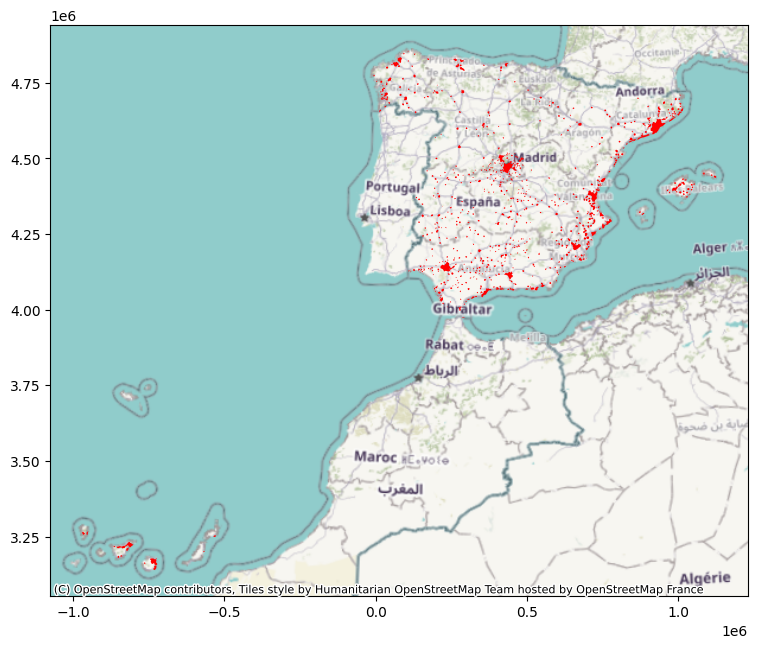

In [4]:
ax = db.plot(color="red", figsize=(9, 9))
cx.add_basemap(ax, crs=db.crs)

## Providers
- There is a whole host of providers, so you can switch easily between backgrounds:

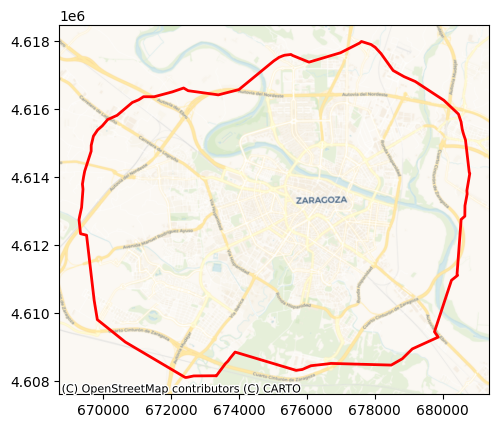

In [8]:
zaragoza = db.query("city_id == 'ci122'")
ax = zaragoza.plot(facecolor="none",
                   edgecolor="red",
                   linewidth=2
                  )
cx.add_basemap(ax,
               crs=zaragoza.crs.to_string(),
               source=cx.providers.CartoDB.Voyager
              )

In [9]:
zaragoza

,city_id,n_buildings,geometry
112,ci122,23604,"POLYGON ((672442.171 4608117.375, 672413.234 4..."


- They are coming from `xyzservices <https://xyzservices.readthedocs.io/en/stable/>`__ as a xyzservices.Bunch object which makes them easy to explore within Python, especially in an interactive environment (like Jupyter).

In [10]:
cx.providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'name': 'OpenStreetMap.CAT'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contribut

In [11]:
cx.providers.OpenStreetMap

{'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.Mapnik'},
 'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.DE'},
 'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
  'max_zoom': 18,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap contributors',
  'bounds': [[45, 5], [48, 11]],
  'name': 'OpenStreetMap.CH'},
 'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
  'max_zoom': 20,
  'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
  'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
  'name': 'OpenStreetMap.France'},
 'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
  'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
  'name': 'OpenStreetMap.HOT'},
 'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
  'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
  'bounds': [[46.2, -5.5], [50, 0.7]],
  'name': 'OpenStreetMap.BZH'},
 'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
  'max_zoom': 19,
  'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
  'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
  'name': 'OpenStreetMap.CAT'}}

- You can pass predefined tile providers from contextily.providers module or any other xyzservices.TileProvider.

- And it is all based on standard XYZ tile protocol, so if you have your own tile service that follows it, you can use it too! See the documentation of `xyzservices <https://xyzservices.readthedocs.io/en/stable/index.html>`__ for more details on how to work with providers.

## Coordinate-based searches
- Additional shapes are not required to access tiles. As long as you have a bounding box of coordinates, you can access tiles. This bounding box needs to be expressed either in Web (Spherical) Mercator or in longitude and latitude (WGS84).

- For example, let’s grab the bounding box for Ghent (Belgium):

In [12]:
west, south, east, north = (
    3.616218566894531,
    50.98912458110244,
    3.8483047485351562,
    51.13994019806845
             )

- To download tiles, we can use bounds2img:

In [13]:
ghent_img, ghent_ext = cx.bounds2img(west,
                                     south,
                                     east,
                                     north,
                                     ll=True,
                                     source=cx.providers.CartoDB.Voyager
                                    )

- This returns a three-dimensional array with the image colors:

In [16]:
ghent_img.shape

(1024, 768, 4)

- And the extent of the basemap downloaded (in Web Mercator):

In [15]:
ghent_ext

(401141.5244406049, 430493.34330211265, 6613943.183459732, 6653078.941941739)

- With these two bits of information, we can render it on matplotlib:

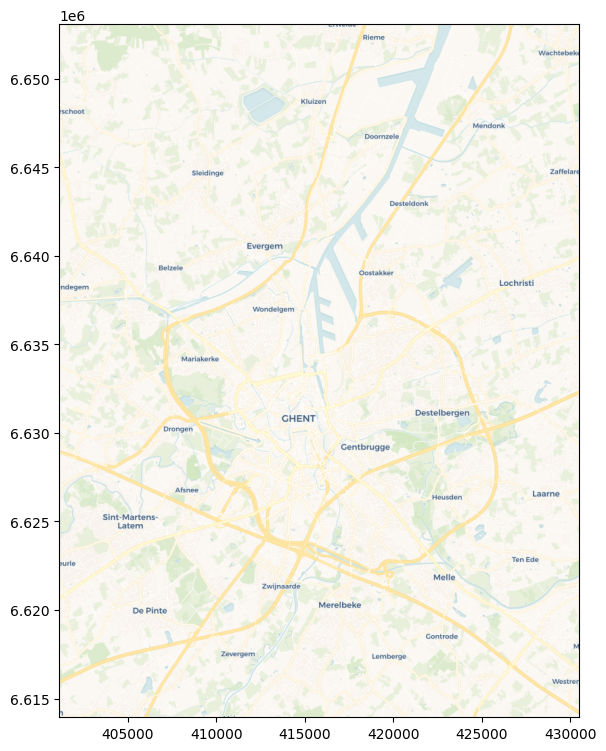

In [17]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(ghent_img, extent=ghent_ext)

## Places
- You can also access tiles of places with a text-based search, and contextily will do its best to find you a solution (this functionality is thanks to `geopy <https://geopy.readthedocs.io/en/stable/>`__, an amazing geocoding package, working under the hood):

In [24]:
nightlights = cx.providers.NASAGIBS.ViirsEarthAtNight2012
vietnam = cx.Place("Vietnam", source=nightlights)

- Once acquired, plotting it is one command away:

<Axes: title={'center': 'Việt Nam'}, xlabel='X', ylabel='Y'>

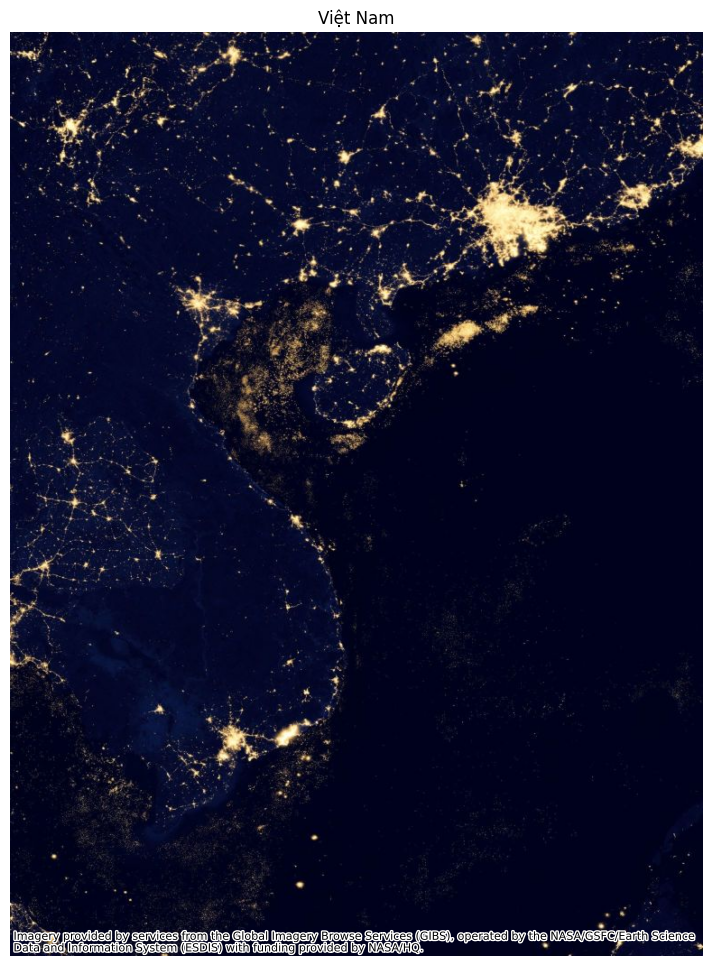

In [25]:
vietnam.plot()

## Store basemaps locally
- When you are working interactively, it is common to iterate over one visualisation several times and to have to combine several tools, not necessarily always Python. In these two situations, it is very handy if you don’t have to re-download a basemap every new iteration. contextily helps you with both.

- First, in a given session, each tile is only downloaded once. Tiles are stored in a temporary cache so the next time you need it, you don’t have go to the web. This results in important time savings and network footprint.

In [26]:
%time tempe = cx.Place("Tempe, AZ")

CPU times: total: 344 ms
Wall time: 13.1 s


In [27]:
%time tempe = cx.Place("Tempe, AZ")

CPU times: total: 0 ns
Wall time: 1.08 s


<Axes: title={'center': 'Tempe, Maricopa County, Arizona, United States of America'}, xlabel='X', ylabel='Y'>

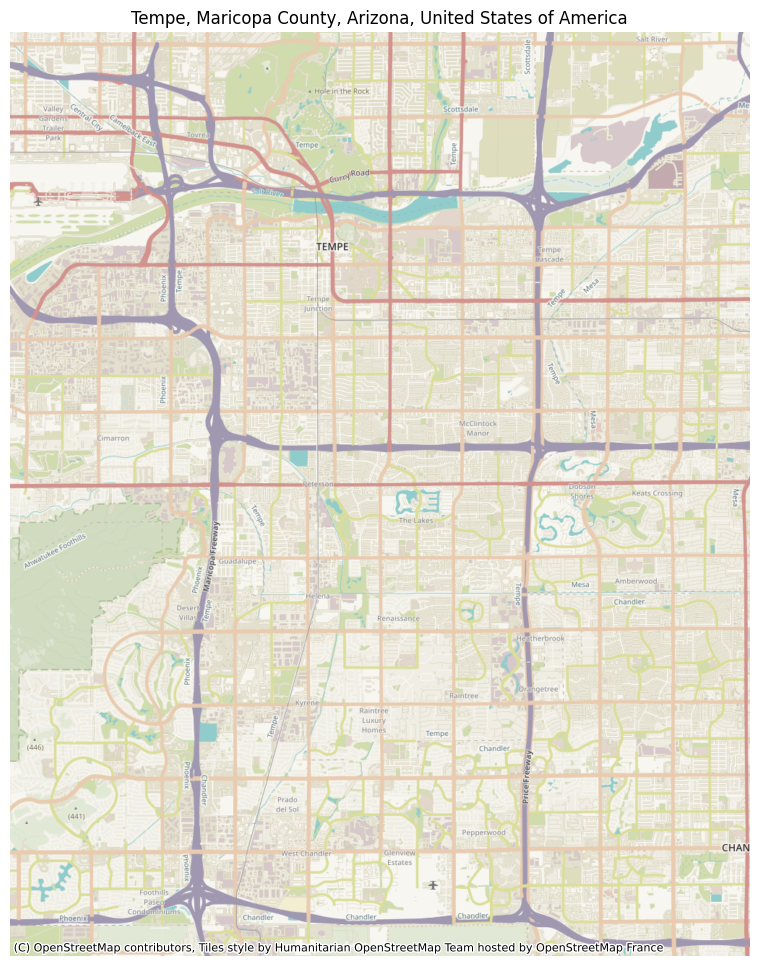

In [28]:
tempe.plot()

- Second, contextily lets you download basemaps and store them in standard raster files that you can open back in Python, or in any other GIS. There are several ways to access this functionality. One is through the Places API:

In [30]:
bristol = cx.Place("Bristol, UK", path="bristol.tif")

- this downloads a basemap for Bristol and saves it to a file called bristol.tif, which you can access, for example, with rasterio:

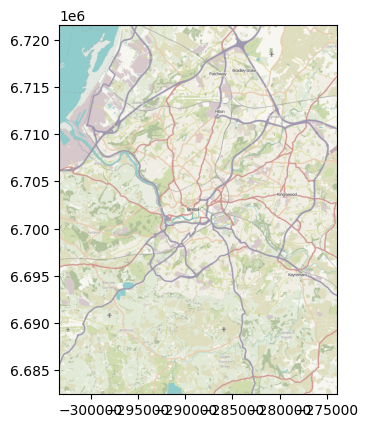

In [31]:
with rasterio.open("bristol.tif") as r:
    rioshow(r)

- And you can also pull down basemaps using bounds2img’s sister method, bounds2raster, which works similarly:

In [32]:
w, s, e, n = (-3.0816650390625,
              53.268087670237485,
             -2.7582550048828125,
              53.486002749115556)
_ = cx.bounds2raster(w, s, e, n,
                     ll=True,
                     path="liverpool.tif",
                     source=cx.providers.CartoDB.Positron
                    )

- And view it equally:

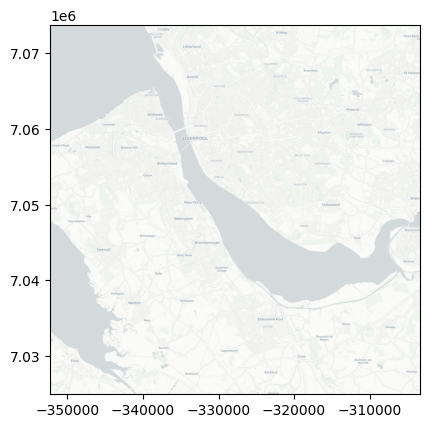

In [33]:
with rasterio.open("liverpool.tif") as r:
    rioshow(r)

## Fine tune zoom levels
- Tile-based basemaps are provided at different zoom levels. Usually, contextily will automatically figure out an appropriate level so you don’t have to think about it. But sometimes, a user might want to fiddle with zoom levels on her own. For these tasks, the zoom parameter will be your friend.

- For example, let’s return to the Ghent map:

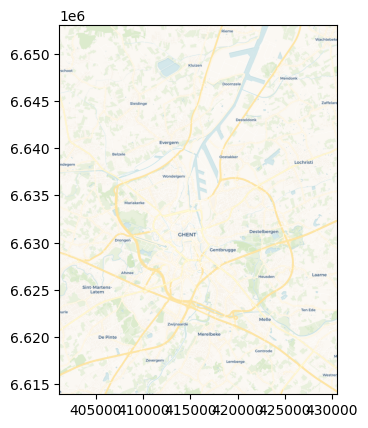

In [34]:
plt.imshow(ghent_img, extent=ghent_ext)

- If we want a lower degree of resolution, maybe we can try level 10?

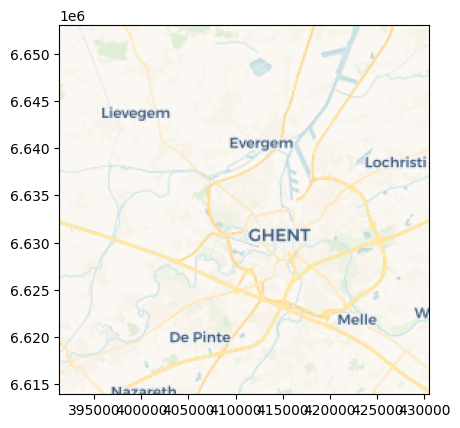

In [35]:
ghent_img, ghent_ext = cx.bounds2img(west,
                                     south,
                                     east,
                                     north,
                                     ll=True,
                                     source=cx.providers.CartoDB.Voyager,
                                     zoom=10,
                                    )
plt.imshow(ghent_img, extent=ghent_ext)

- If you want to peak into the automatic level calculated, you can do it:

In [36]:
cx.tile._calculate_zoom(w, s, e, n)

12

- Higher levels of resolution for the same extent involve more tiles being downloaded, which may take longer, so keep this in mind if you “bump up” the resolution. To check how many tiles need to be downloaded, you can use this other utility:

In [37]:
cx.howmany(w, s, e, n, 13, ll=True)

Using zoom level 13, this will download 81 tiles


81

In [38]:
cx.howmany(w, s, e, n, 15, ll=True)

Using zoom level 15, this will download 1020 tiles


1020

In [39]:
cx.howmany(w, s, e, n, 10, ll=True)

Using zoom level 10, this will download 4 tiles


4

## Using transparent layers
- Sometimes, when you plot data on a basemap, the data will obscure some important map elements, such as labels, that you would otherwise want to see unobscured.

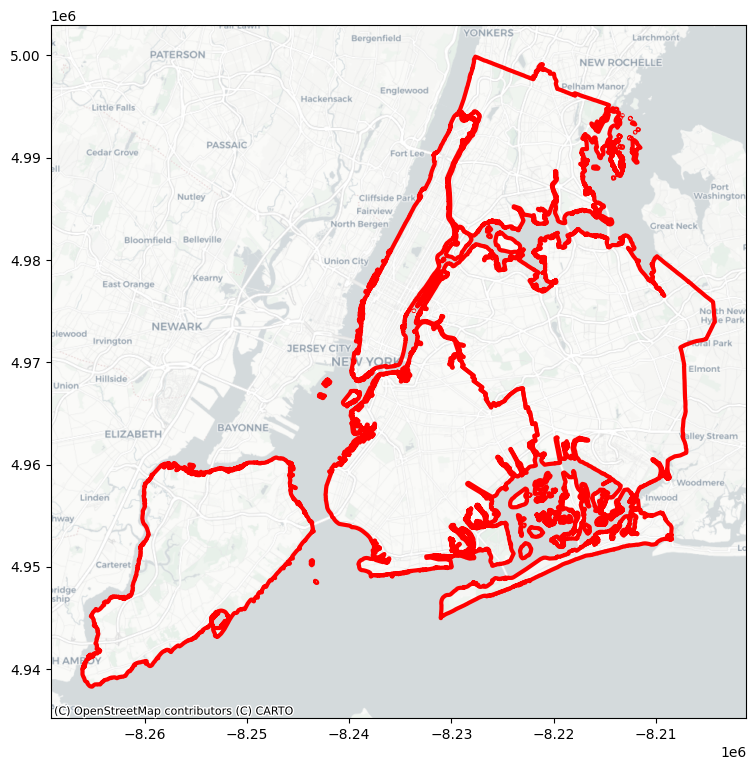

In [40]:
df = geopandas.read_file(get_path('nybb')).to_crs(epsg=3857)
ax = df.plot(figsize=(9,9), color="none", edgecolor="r", linewidth=3)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.Positron)

- Some map tile providers offer multiple sets of partially transparent tiles to solve this, and contextily will do its best to auto-detect these transparent layers and put them on top.

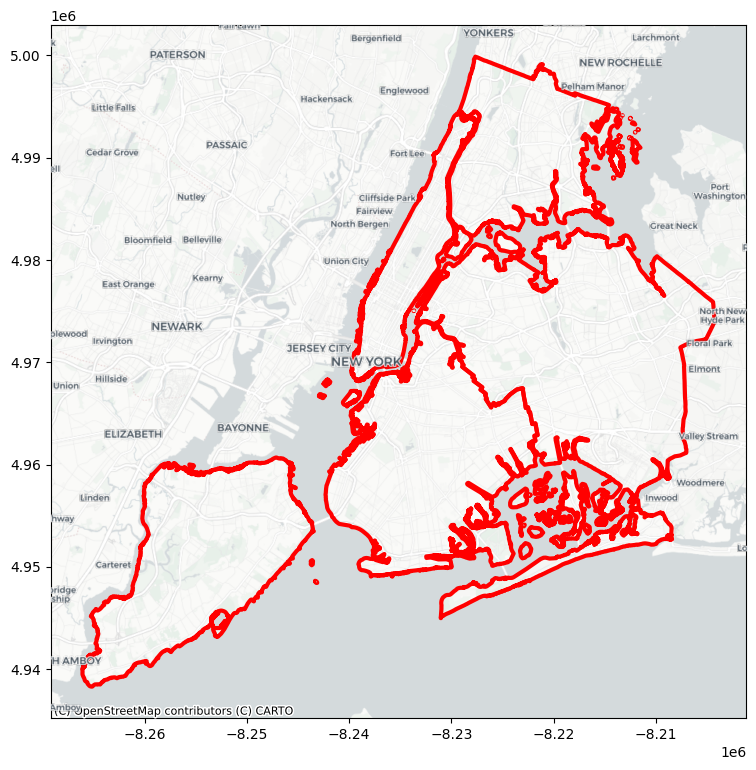

In [41]:
ax = df.plot(figsize=(9,9), color="none", edgecolor="r", linewidth=3)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.PositronOnlyLabels)

- By splitting the layers like this, you can also independently manipulate the level of zoom on each layer, for example to make labels larger while still showing a lot of detail.

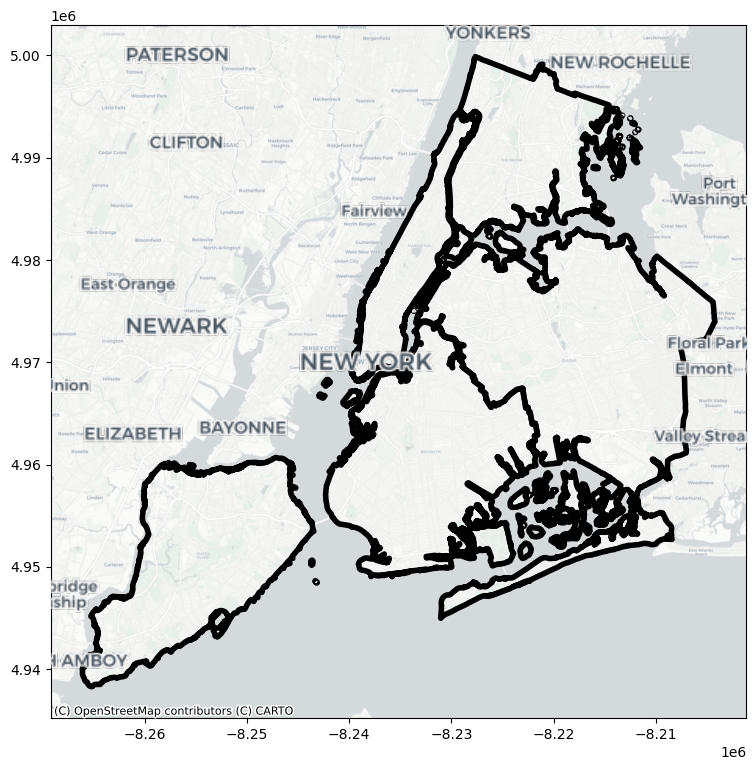

In [42]:
ax = df.plot(figsize=(9,9), color="none", edgecolor="k", linewidth=4)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.Positron, zoom=12)
cx.add_basemap(ax, crs=df.crs.to_string(), source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10)

# Guide to the Place API
- from https://contextily.readthedocs.io/en/latest/places_guide.html#Guide-to-the-Place-API

## Using contextily to get maps & more of named places

- Contextily allows to get location information as well as a map from named places through the Places API. These places could be countries, cities, or streets. The geocoding is handled by geopy and the default service provider is OpenStreetMap’s Nominatim. We can get a place by instantiating a Place object by simply passing a query string that is passed on to the geocoder.


In [43]:
import geopandas as gpd
from shapely.geometry import box, Point
from contextily import Place
import contextily as cx
import numpy as np
from matplotlib import pyplot as plt
import rasterio
from rasterio.plot import show as rioshow

plt.rcParams["figure.dpi"] = 70 # lower image size

## Instantiating a Place object

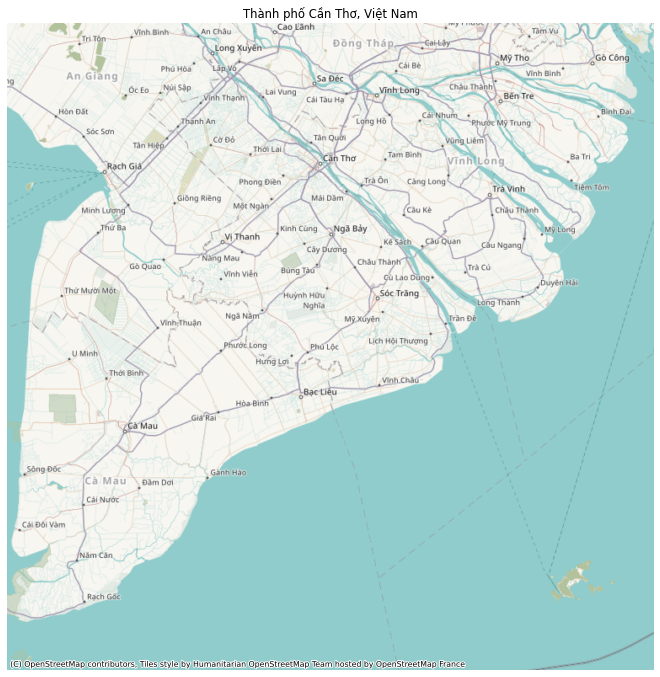

In [44]:
can_tho = Place("Can Tho, Vietnam")
ax = can_tho.plot()

- The zoom level is detected automatically, but can be adjusted through the zoom argument.

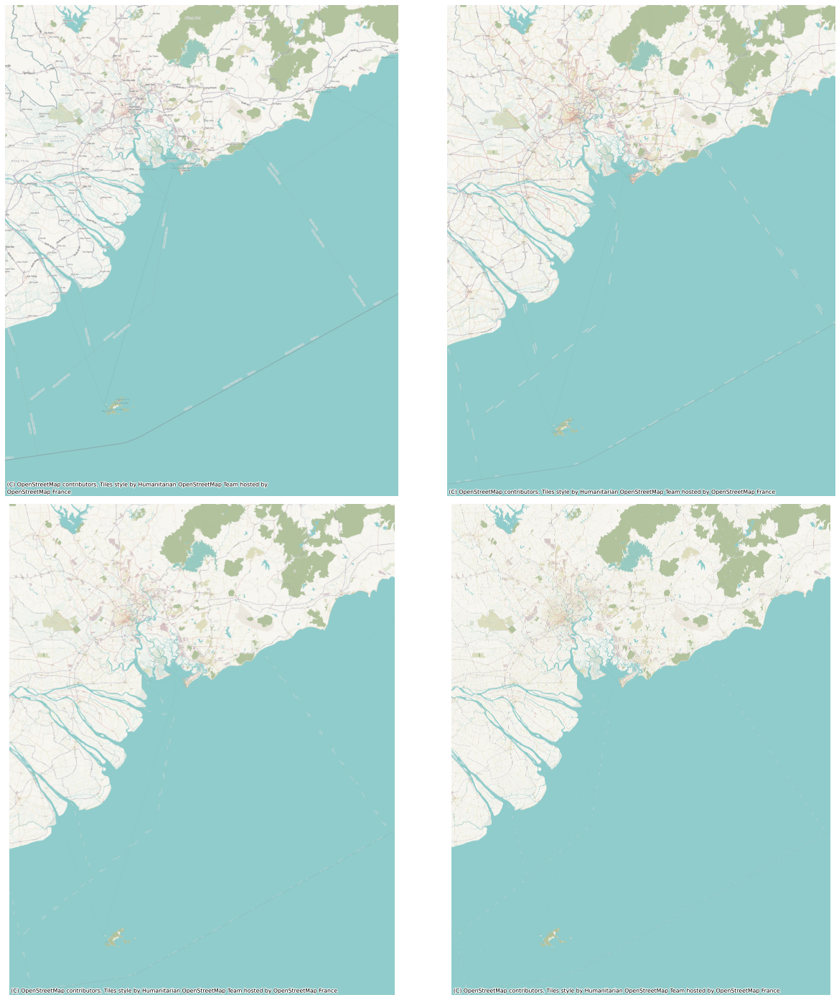

In [45]:
fig, axs = plt.subplots(2,2, figsize=(20,20))
for i, zoom_lvl in enumerate([10, 11, 12, 13]):
    ax = Place("Ho Chi Minh City, Vietnam", zoom=zoom_lvl).plot(ax=axs.flatten()[i])
    ax.axis("off")
    plt.tight_layout()

- Bear in mind that increasing the zoom level by one leads to four times as many tiles being downloaded:

In [46]:
for zoom_lvl in [12, 13, 14, 15, 16]:
    cx.howmany(*can_tho.bbox, zoom_lvl, ll=True)

Using zoom level 12, this will download 300 tiles
Using zoom level 13, this will download 1131 tiles
Using zoom level 14, this will download 4332 tiles
Using zoom level 15, this will download 16950 tiles
Using zoom level 16, this will download 67500 tiles


- The basemap provider can be set with the source argument.

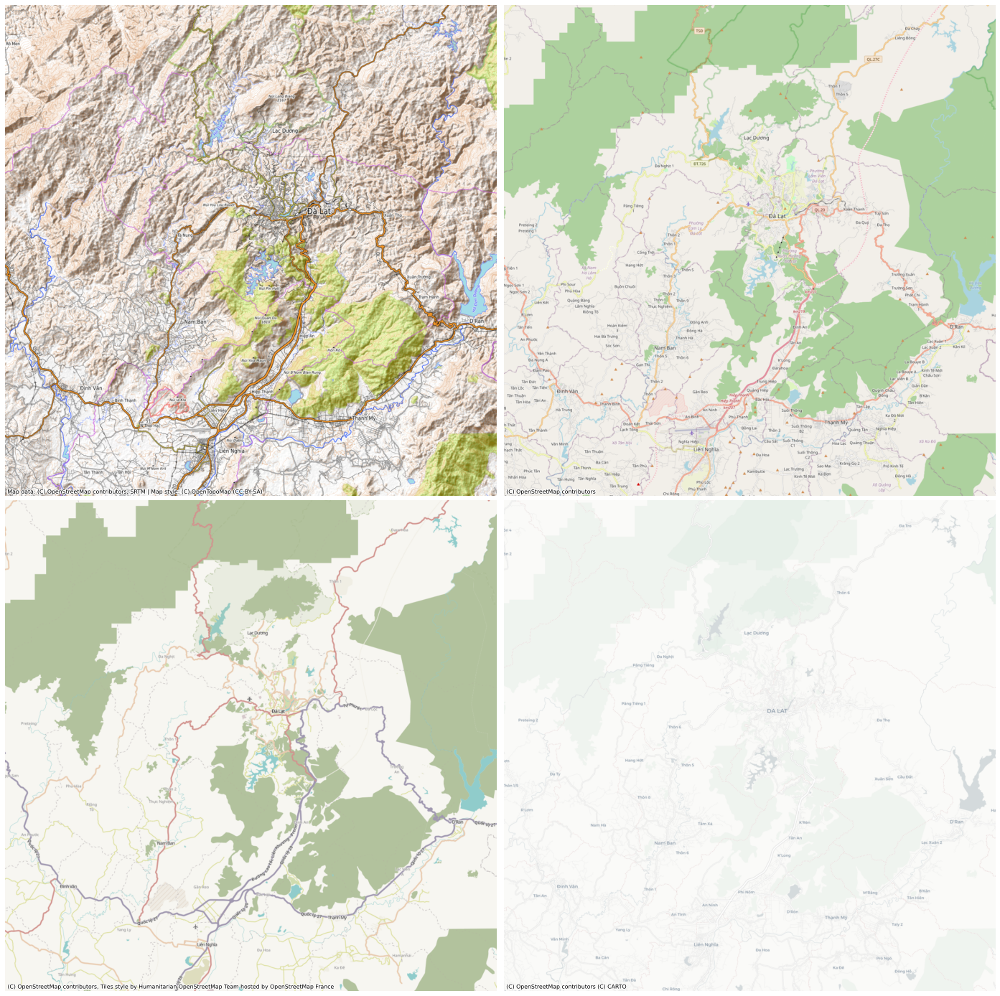

In [47]:
fig, axs = plt.subplots(2,2, figsize=(20,20))
for i, source in enumerate([cx.providers.OpenTopoMap,
               cx.providers.OpenStreetMap.Mapnik,
               cx.providers.OpenStreetMap.HOT,
               cx.providers.CartoDB.Positron
              ]):
    ax = Place("Da Lat, Vietnam", source=source).plot(ax=axs.flatten()[i])
    ax.axis("off")
    plt.tight_layout()

- There are many providers to choose from. They can be explored from within Python

In [48]:
cx.providers.keys()

dict_keys(['OpenStreetMap', 'MapTilesAPI', 'OpenSeaMap', 'OPNVKarte', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Stadia', 'Thunderforest', 'BaseMapDE', 'CyclOSM', 'Jawg', 'MapBox', 'MapTiler', 'TomTom', 'Esri', 'OpenWeatherMap', 'HERE', 'HEREv3', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'GeoportailFrance', 'OneMapSG', 'USGS', 'WaymarkedTrails', 'OpenAIP', 'OpenSnowMap', 'AzureMaps', 'SwissFederalGeoportal', 'TopPlusOpen', 'Gaode', 'Strava', 'OrdnanceSurvey', 'UN'])

- The image returned by the Place API can be saved separately by specifying the path argument upon instantiation

In [49]:
scq = Place("Nha Trang, Vietnam", path="nha_trang.tif")

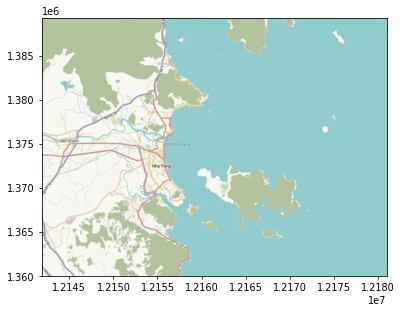

In [50]:
with rasterio.open("nha_trang.tif") as r:
    rioshow(r)

## Exploring the Place object’s attributes
- The image can be accessed separately:

plt.imshow(can_tho.im)

- If a path has been set at instantiation, the path can also be easily accessed:

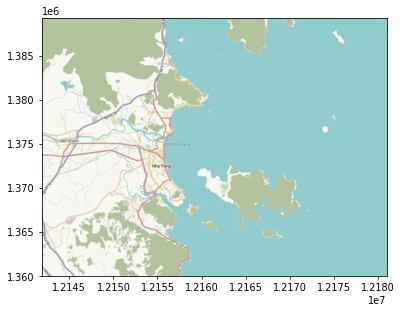

In [51]:
with rasterio.open(scq.path) as r:
    rioshow(r)

- The center coordinates of a place as returned by the geocoder are also available

In [52]:
can_tho.longitude, can_tho.latitude

(105.7872656, 10.0362046)

- The place object has a bounding box of the geocoded place, as well as a bounding box of the map

In [53]:
can_tho.bbox

[np.float64(105.2256784),
 np.float64(8.702505),
 np.float64(106.4538443),
 np.float64(10.3252088)]

In [55]:
can_tho.w, can_tho.s, can_tho.e, can_tho.n

(np.float64(105.2256784),
 np.float64(8.702505),
 np.float64(106.4538443),
 np.float64(10.3252088))

- The bounding box of the map can come in handy when you want to get close-up maps of e.g. certain neighborhoods within a city:

In [56]:
# Create random points within map bbox
Y = np.random.uniform(low=can_tho.bbox_map[2], high=can_tho.bbox_map[3], size=(8000,))
X = np.random.uniform(low=can_tho.bbox_map[1], high=can_tho.bbox_map[0], size=(8000,))
r_points = [Point(x,y) for x,y in zip(X,Y)]
df = gpd.GeoDataFrame(r_points, geometry=0, crs="EPSG:3857")

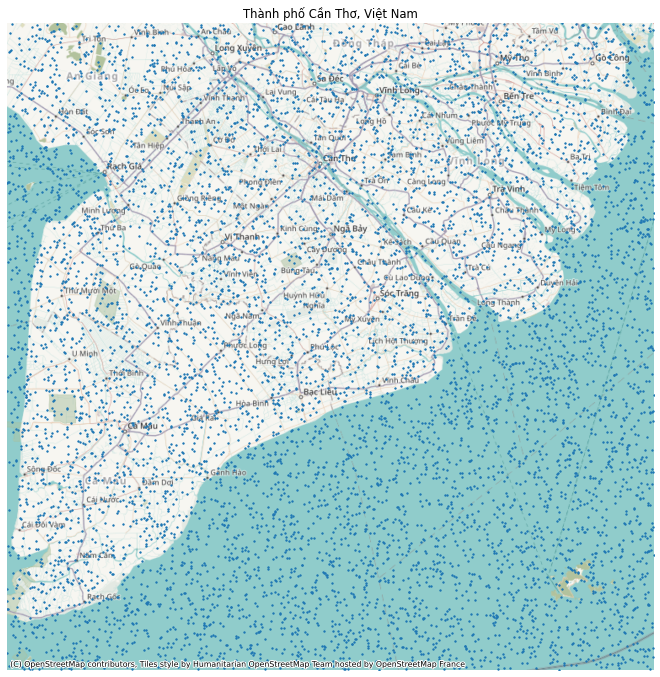

In [57]:
ax = can_tho.plot()
ax2 = df.plot(ax=ax, markersize=2)

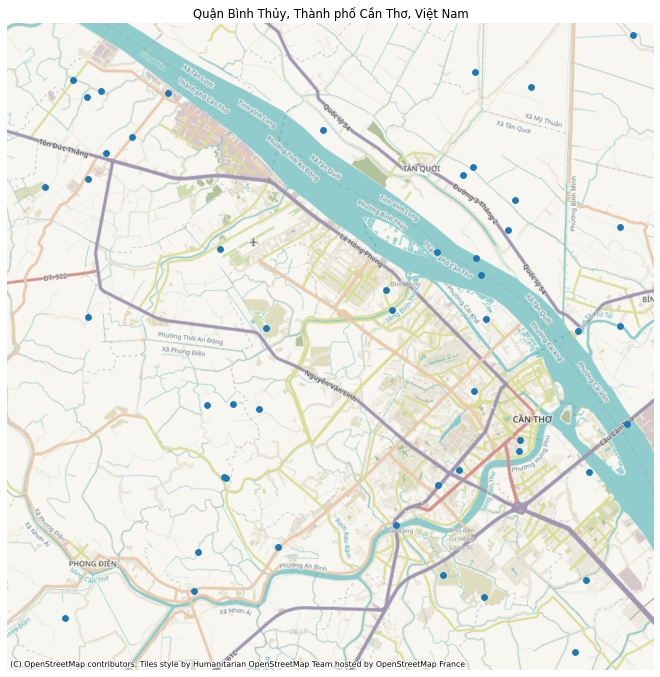

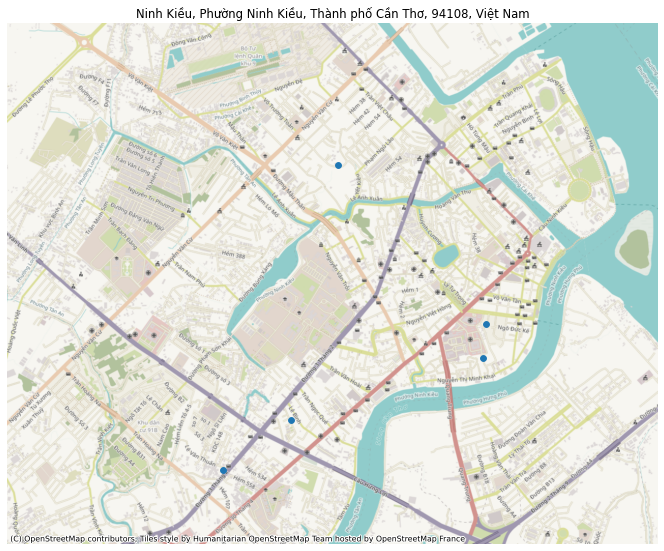

In [59]:
can_tho_neighborhoods = ["Binh Thuy", "Ninh Kieu"]

for urban in can_tho_neighborhoods:
    place = Place(f"{urban}, Can Tho, Vietnam")

    # get close-up maps for each neighborhood
    e, w, s, n = place.bbox_map

    ax = place.plot()
    df.cx[e:w, s:n].plot(ax=ax)